In [1]:
# Import libraries
import librosa
import librosa.display
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from matplotlib.pyplot import specgram
import pandas as pd
import glob 
from sklearn.metrics import confusion_matrix
import IPython.display as ipd  # To play sound in the notebook
import os
import sys
import warnings
# ignore warnings 
if not sys.warnoptions:
    warnings.simplefilter("ignore")
warnings.filterwarnings("ignore", category=DeprecationWarning)

In [2]:
RAV ="C:\\Ravdes\\RAVDESS\\audio_speech_actors_01-24\\"
print(RAV)

C:\Ravdes\RAVDESS\audio_speech_actors_01-24\


In [3]:
dir_list = os.listdir(RAV)
dir_list.sort()

emotion = []
gender = []
path = []
for i in dir_list:
    fname = os.listdir(RAV + i)
    for f in fname:
        part = f.split('.')[0].split('-')
        emotion.append(int(part[2]))
        temp = int(part[6])
        if temp%2 == 0:
            temp = "F"
        else:
            temp = "M"
        gender.append(temp)
        path.append(RAV + i + '/' + f)

        
RAV_df = pd.DataFrame(emotion)
RAV_df = RAV_df.replace({1:'neutral', 2:'calm', 3:'happy', 4:'sad', 5:'angry', 6:'fear', 7:'disgust', 8:'surprise'})
RAV_df = pd.concat([pd.DataFrame(gender),RAV_df],axis=1)
RAV_df.columns = ['gender','emotion']
RAV_df['labels'] =RAV_df.gender + '_' + RAV_df.emotion
RAV_df['source'] = 'RAVDESS'  
RAV_df = pd.concat([RAV_df,pd.DataFrame(path, columns = ['path'])],axis=1)
RAV_df = RAV_df.drop(['gender', 'emotion'], axis=1)
RAV_df.labels.value_counts()

M_angry       96
F_disgust     96
M_sad         96
F_angry       96
F_sad         96
F_calm        96
F_surprise    96
M_calm        96
M_fear        96
F_fear        96
M_happy       96
M_disgust     96
F_happy       96
M_surprise    96
F_neutral     48
M_neutral     48
Name: labels, dtype: int64

In [4]:
RAV_df.head(7)

,labels,source,path
0,M_neutral,RAVDESS,C:\Ravdes\RAVDESS\audio_speech_actors_01-24\Ac...
1,M_neutral,RAVDESS,C:\Ravdes\RAVDESS\audio_speech_actors_01-24\Ac...
2,M_neutral,RAVDESS,C:\Ravdes\RAVDESS\audio_speech_actors_01-24\Ac...
3,M_neutral,RAVDESS,C:\Ravdes\RAVDESS\audio_speech_actors_01-24\Ac...
4,M_calm,RAVDESS,C:\Ravdes\RAVDESS\audio_speech_actors_01-24\Ac...
5,M_calm,RAVDESS,C:\Ravdes\RAVDESS\audio_speech_actors_01-24\Ac...
6,M_calm,RAVDESS,C:\Ravdes\RAVDESS\audio_speech_actors_01-24\Ac...


In [5]:
RAV_df.describe()

,labels,source,path
count,1440,1440,1440
unique,16,1,1440
top,M_angry,RAVDESS,C:\Ravdes\RAVDESS\audio_speech_actors_01-24\Ac...
freq,96,1440,1


In [6]:
RAV_df.labels.unique()

array(['M_neutral', 'M_calm', 'M_happy', 'M_sad', 'M_angry', 'M_fear',
       'M_disgust', 'M_surprise', 'F_neutral', 'F_calm', 'F_happy',
       'F_sad', 'F_angry', 'F_fear', 'F_disgust', 'F_surprise'],
      dtype=object)

In [7]:
RAV_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1440 entries, 0 to 1439
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   labels  1440 non-null   object
 1   source  1440 non-null   object
 2   path    1440 non-null   object
dtypes: object(3)
memory usage: 33.9+ KB


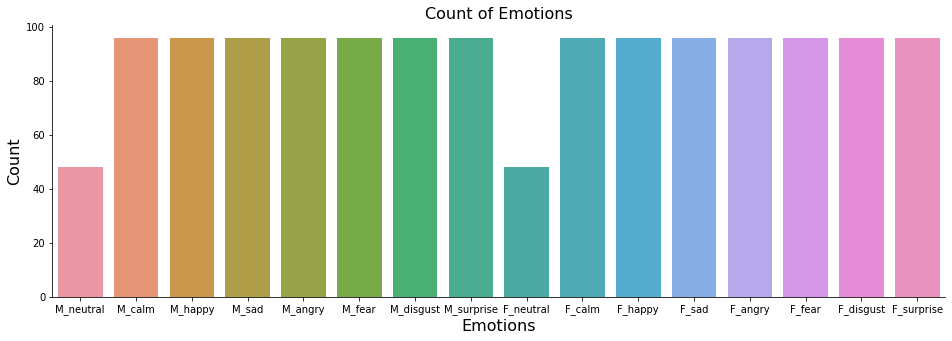

In [8]:
import seaborn as sns
plt.figure(figsize=(16,5))
plt.title('Count of Emotions', size=16)
sns.countplot(RAV_df.labels)
plt.ylabel('Count', size=16)
plt.xlabel('Emotions', size=16)
#plt.xticks(rotation=90)
sns.despine(top=True, right=True, left=False, bottom=False)

plt.show()

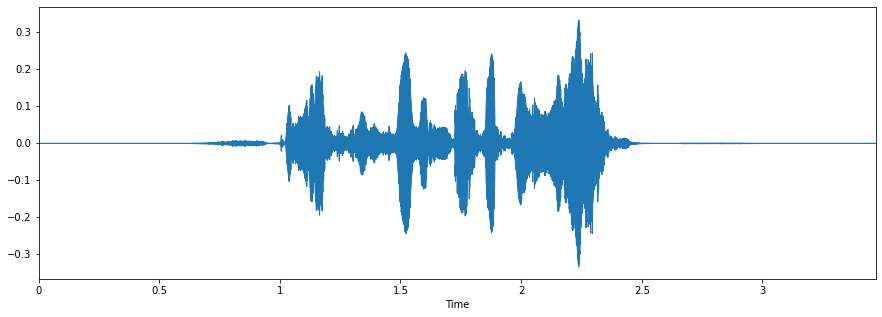

In [9]:
# Pick a fearful track
fname = RAV + 'Actor_14/03-01-06-02-02-02-14.wav'  
data, sampling_rate = librosa.load(fname)
plt.figure(figsize=(15, 5))
librosa.display.waveplot(data, sr=sampling_rate)

# play the audio 
ipd.Audio(fname)

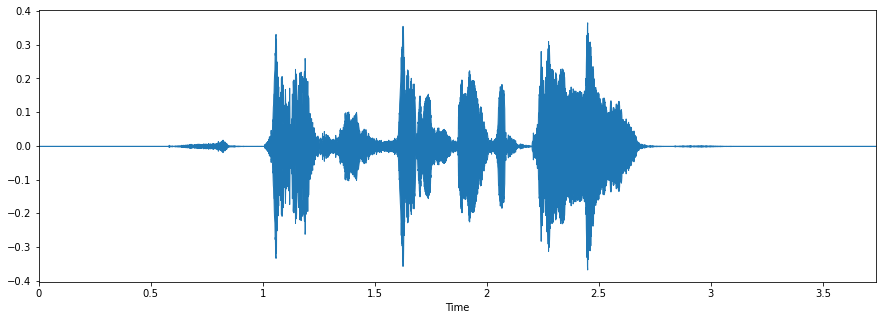

In [10]:
# Pick a happy track
fname = RAV + 'Actor_14/03-01-03-02-02-02-14.wav'  
data, sampling_rate = librosa.load(fname)
plt.figure(figsize=(15, 5))
librosa.display.waveplot(data, sr=sampling_rate)

# Lets play the audio 
ipd.Audio(fname)

In [11]:
from IPython.display import Audio
from IPython.display import display

In [12]:
def create_waveplot(data, sr, e):
    plt.figure(figsize=(10, 3))
    plt.title('Waveplot for {} emotion'.format(e), size=15)
    librosa.display.waveplot(data, sr=sr)
    plt.show()

def create_spectrogram(data, sr, e):
    X = librosa.stft(data)
    Xdb = librosa.amplitude_to_db(abs(X))
    plt.figure(figsize=(12, 3))
    plt.title('Spectrogram for {} emotion'.format(e), size=15)
    librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')   
    plt.colorbar()

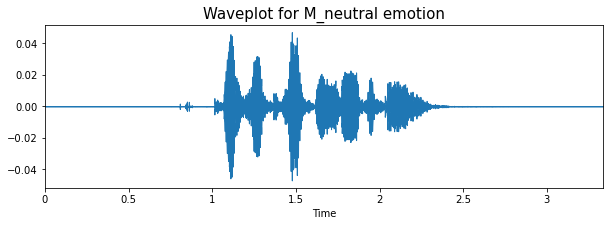

(73574,)


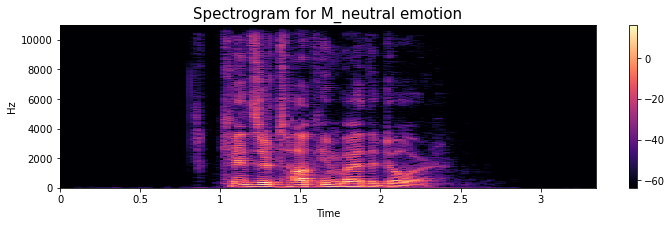

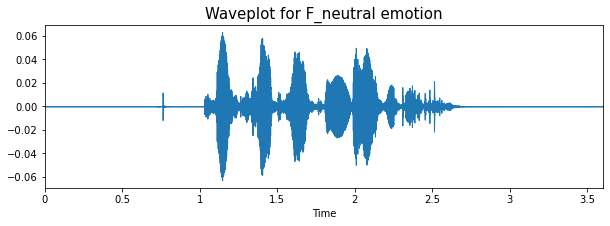

(79460,)


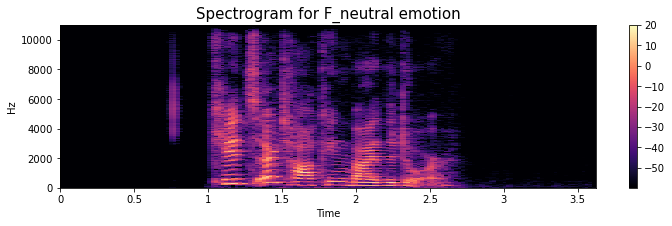

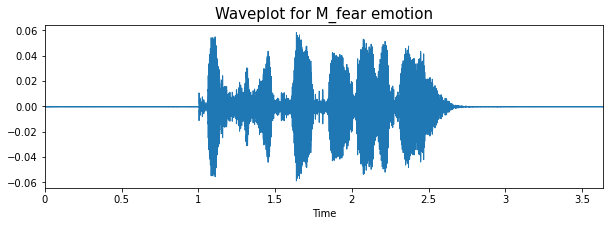

(80196,)


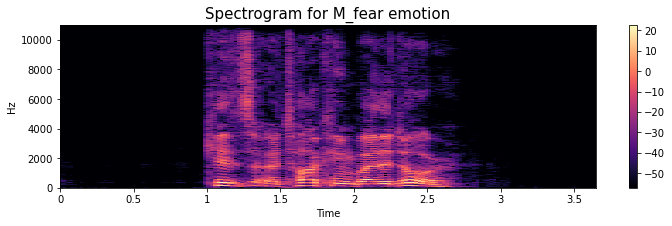

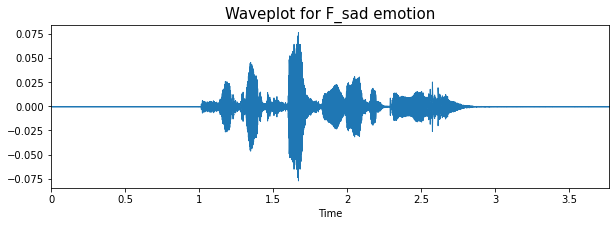

(83139,)


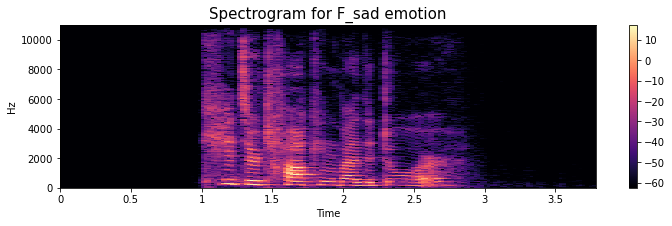

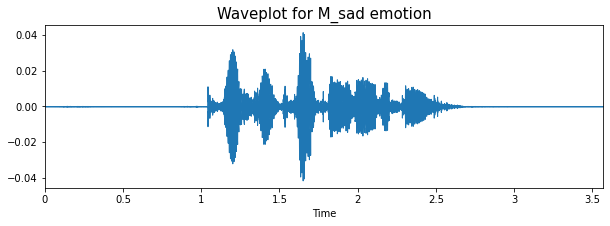

(78724,)


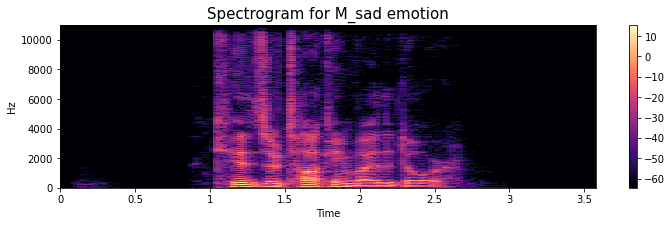

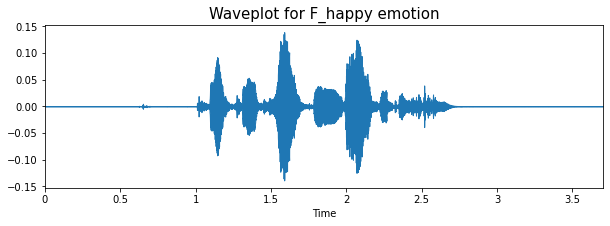

(81667,)


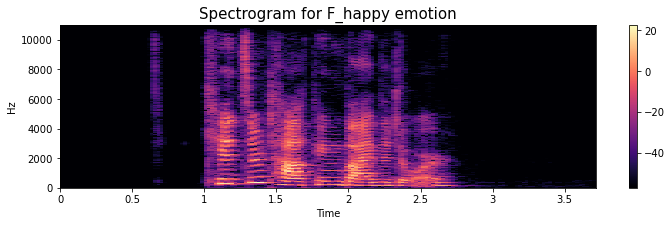

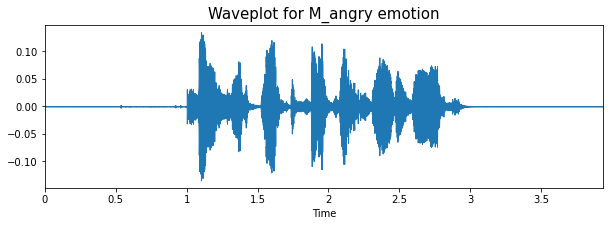

(86817,)


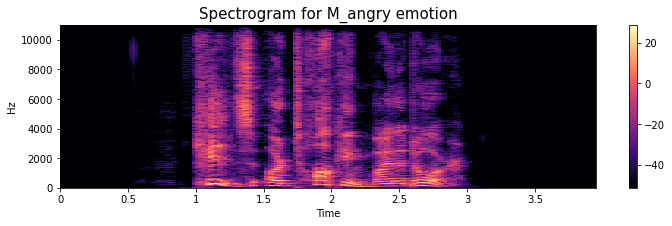

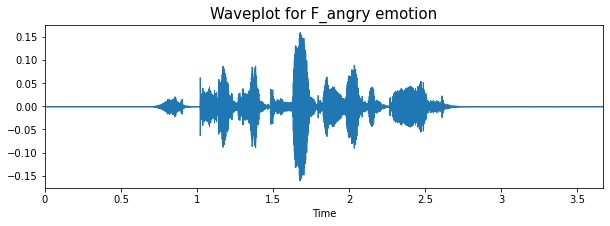

(80931,)


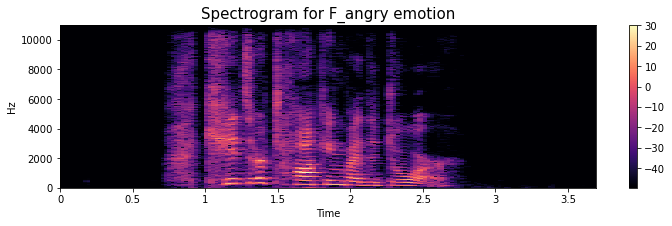

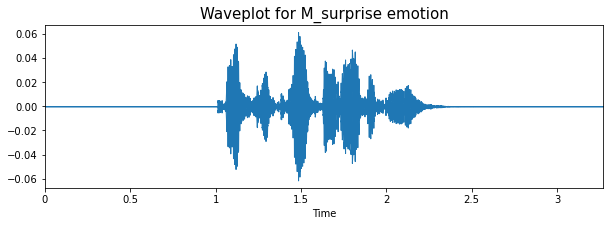

(72102,)


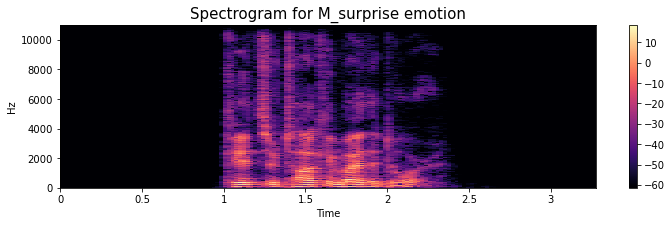

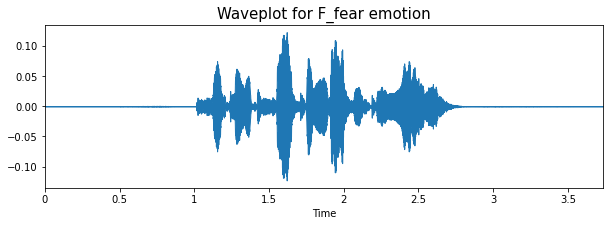

(82403,)


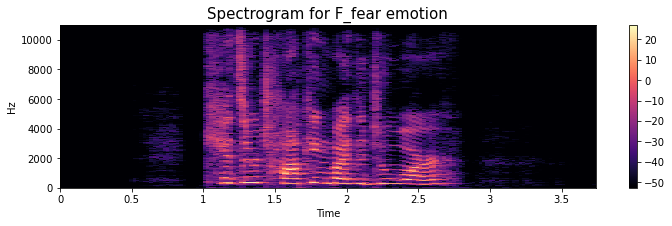

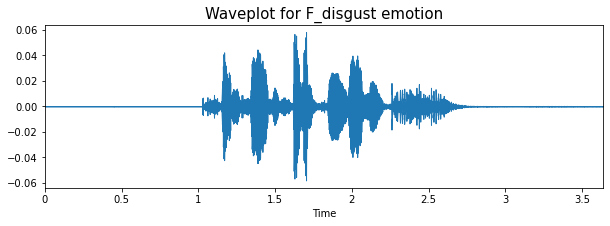

(80196,)


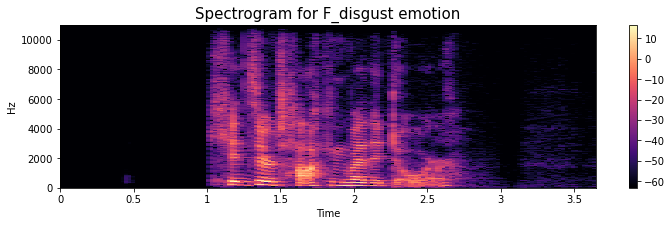

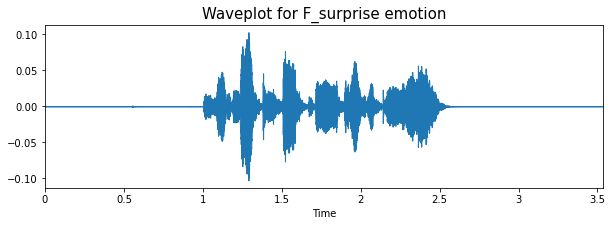

(77988,)


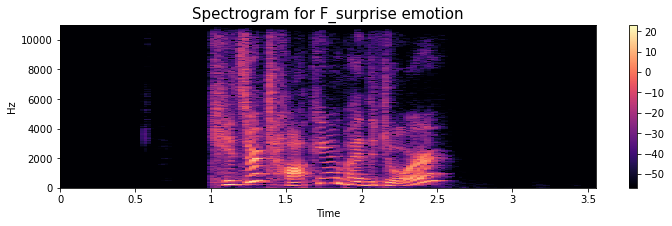

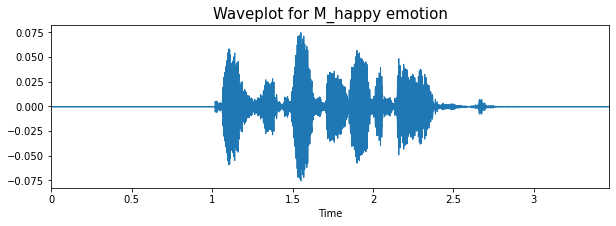

(76517,)


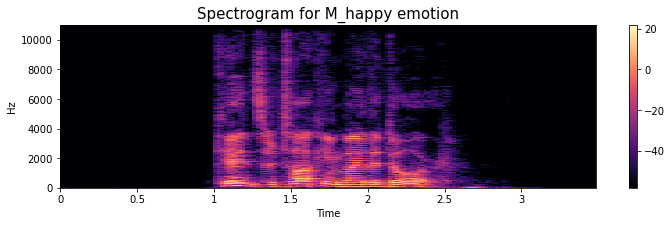

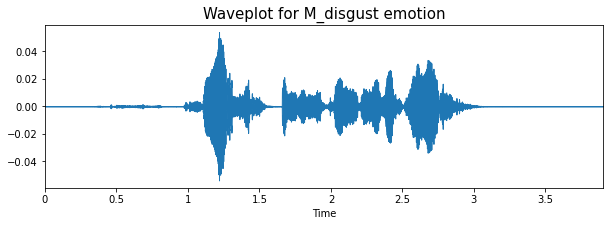

(86081,)


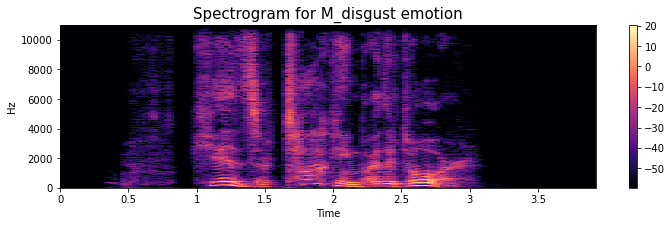

In [13]:
emotions = ['M_neutral', 'F_neutral', 'M_fear', 'F_sad', 'M_sad', 'F_happy','M_angry','F_angry','M_surprise','F_fear','F_disgust',
           'F_surprise','M_happy','M_disgust']
for emotion in emotions:
    path = np.array(RAV_df.path[RAV_df.labels==emotion])[1]
    data, sampling_rate = librosa.load(path)
    create_waveplot(data, sampling_rate, emotion)
    create_spectrogram(data, sampling_rate, emotion)
    display(Audio(path))
    print(data.shape)

In [14]:
def extract_features_time(data, sample_rate):
    # ZCR
    zcr = np.mean(librosa.feature.zero_crossing_rate(y=data).T, axis=0)
    
    # Energy
    frame_length=2048
    hop_length=512
    en = np.mean([np.sum(np.power(np.abs(data[hop:hop+frame_length]), 2)) for hop in range(0, data.shape[0], hop_length)])
    
    return np.append(zcr,en)
    
def extract_features_spect(data, sample_rate):
    # MelSpectogram
    return librosa.feature..(y=data, sr=sample_rate)

In [15]:
data = []
sample_rates = []
for path in RAV_df.path:
    aud, sam = librosa.load(path)
    data.append(aud)
    sample_rates.append(sam)

In [16]:
for i in range(1440):
    data[i] = data[i][:56072]

In [17]:
for i in range(1440):
    while len(data[i]) < 56072:
        data[i] = np.append(data[i], 0)

In [18]:
x_time, y = [], []
x_spect = []
for audio_file, sample_rate, emotion in zip(data, sample_rates, RAV_df.labels):
    x_time.append(extract_features_time(audio_file, sample_rate))
    x_spect.append(extract_features_spect(audio_file, sample_rate))
    y.append(emotion)

In [19]:
x_time = np.array(x_time)
x_spect = np.array(x_spect)
y = np.array(y)
x_time.shape, x_spect.shape, y.shape, RAV_df.path.shape

((1440, 2), (1440, 128, 110), (1440,), (1440,))

In [20]:
Features_time = pd.DataFrame(x_time)
Features_time['labels'] = y

In [21]:
x_time = Features_time.iloc[: ,:-1].values

In [22]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
encoder = OneHotEncoder()
y_time = encoder.fit_transform(np.array(Features_time['labels'].values).reshape(-1,1)).toarray()

In [23]:
from sklearn.model_selection import train_test_split
x_train_time, x_test_time, y_train_time, y_test_time = train_test_split(x_time, y_time,
                                                                        test_size=0.3, random_state=1)
x_train_time, x_val_time, y_train_time, y_val_time = train_test_split(x_train_time, y_train_time,
                                                                      test_size=0.05, random_state=1)

x_train_spect, x_test_spect, y_train_spect, y_test_spect = train_test_split(x_spect, y_time,
                                                                            test_size=0.3, random_state=1)
x_train_spect, x_val_spect, y_train_spect, y_val_spect = train_test_split(x_train_spect, y_train_spect,
                                                                          test_size=0.05, random_state=1)

In [24]:
print((x_train_time.shape, y_train_time.shape, x_test_time.shape, y_test_time.shape, x_val_time.shape, y_val_time.shape))

print((x_train_spect.shape, y_train_spect.shape, x_test_spect.shape, y_test_spect.shape, x_val_spect.shape, y_val_spect.shape))

((957, 2), (957, 16), (432, 2), (432, 16), (51, 2), (51, 16))
((957, 128, 110), (957, 16), (432, 128, 110), (432, 16), (51, 128, 110), (51, 16))


In [25]:
# making our data compatible to model.
x_train_time = np.expand_dims(x_train_time, axis=2)
x_val_time = np.expand_dims(x_val_time, axis=2)
x_test_time = np.expand_dims(x_test_time, axis=2)
x_train_time.shape, x_val_time.shape, x_test_time.shape

((957, 2, 1), (51, 2, 1), (432, 2, 1))

In [26]:
import tensorflow as tf
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv1D, Conv2D ,MaxPooling1D , MaxPooling2D, Flatten, Dropout, BatchNormalization
from tensorflow.keras.callbacks import ModelCheckpoint

In [27]:
model=Sequential()
model.add(Conv1D(256, kernel_size=5, strides=1, padding='same',
                 activation='relu', input_shape=(x_train_time.shape[1], 1)))
model.add(MaxPooling1D(pool_size=5, strides = 2, padding = 'same'))

model.add(Conv1D(256, kernel_size=5, strides=1, padding='same', activation='relu'))
model.add(MaxPooling1D(pool_size=5, strides = 2, padding = 'same'))

model.add(Conv1D(128, kernel_size=5, strides=1, padding='same', activation='relu'))
model.add(MaxPooling1D(pool_size=5, strides = 2, padding = 'same'))
model.add(Dropout(0.2))

model.add(Conv1D(64, kernel_size=5, strides=1, padding='same', activation='relu'))
model.add(MaxPooling1D(pool_size=5, strides = 2, padding = 'same'))

model.add(Flatten())
model.add(Dense(units=32, activation='relu'))
model.add(Dropout(0.3))

model.add(Dense(units=16, activation='softmax'))
model.compile(loss=tf.keras.losses.categorical_crossentropy,
              optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),metrics=['accuracy'])

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d (Conv1D)              (None, 2, 256)            1536      
_________________________________________________________________
max_pooling1d (MaxPooling1D) (None, 1, 256)            0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 1, 256)            327936    
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1, 256)            0         
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 1, 128)            163968    
_________________________________________________________________
max_pooling1d_2 (MaxPooling1 (None, 1, 128)            0         
_________________________________________________________________
dropout (Dropout)            (None, 1, 128)            0

In [28]:
history=model.fit(x_train_time, y_train_time, batch_size=32, epochs=15, validation_data=(x_val_time, y_val_time))

Train on 957 samples, validate on 51 samples
Epoch 1/15
957/957 [==============================] - 1s 1ms/sample - loss: 2.7684 - accuracy: 0.0784 - val_loss: 2.7627 - val_accuracy: 0.1961
Epoch 2/15
957/957 [==============================] - 0s 304us/sample - loss: 2.7588 - accuracy: 0.1076 - val_loss: 2.7471 - val_accuracy: 0.1569
Epoch 3/15
957/957 [==============================] - 0s 299us/sample - loss: 2.7413 - accuracy: 0.1024 - val_loss: 2.7205 - val_accuracy: 0.1569
Epoch 4/15
957/957 [==============================] - 0s 308us/sample - loss: 2.7164 - accuracy: 0.1024 - val_loss: 2.6875 - val_accuracy: 0.1569
Epoch 5/15
957/957 [==============================] - 0s 317us/sample - loss: 2.7135 - accuracy: 0.1003 - val_loss: 2.6667 - val_accuracy: 0.1569
Epoch 6/15
957/957 [==============================] - 0s 297us/sample - loss: 2.7064 - accuracy: 0.1149 - val_loss: 2.6534 - val_accuracy: 0.1569
Epoch 7/15
957/957 [==============================] - 0s 312us/sample - loss: 2.6

## 2D CNN

In [29]:
x_train_spect = np.expand_dims(x_train_spect, axis=3)
x_val_spect = np.expand_dims(x_val_spect, axis=3)
x_test_spect = np.expand_dims(x_test_spect, axis=3)
x_train_spect.shape, x_val_spect.shape, x_test_spect.shape

((957, 128, 110, 1), (51, 128, 110, 1), (432, 128, 110, 1))

In [30]:
model_spect = Sequential()
model_spect.add(Conv2D(32, kernel_size =(5, 5), strides =(1, 1),
                 activation ='relu', input_shape=(128, 110, 1)))
model_spect.add(MaxPooling2D(pool_size =(2, 2), strides =(2, 2)))
model_spect.add(Conv2D(64, (5, 5), activation ='relu'))
model_spect.add(MaxPooling2D(pool_size =(2, 2)))
model_spect.add(Flatten())
model_spect.add(Dense(1000, activation ='relu'))
model_spect.add(Dense(16, activation ='softmax'))

model_spect.compile(loss=tf.keras.losses.categorical_crossentropy,
                    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
                    metrics=['accuracy'])

model_spect.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 124, 106, 32)      832       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 62, 53, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 58, 49, 64)        51264     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 29, 24, 64)        0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 44544)             0         
_________________________________________________________________
dense_2 (Dense)              (None, 1000)              44545000  
_________________________________________________________________
dense_3 (Dense)              (None, 16)               

In [32]:
history_spect = model_spect.fit(x_train_spect, y_train_spect,
                                batch_size=16, epochs=15, validation_data=(x_val_spect, y_val_spect))

Train on 957 samples, validate on 51 samples
Epoch 1/15
957/957 [==============================] - 27s 28ms/sample - loss: 1.1473 - accuracy: 0.6635 - val_loss: 2.9615 - val_accuracy: 0.4902
Epoch 2/15
957/957 [==============================] - 23s 24ms/sample - loss: 1.1966 - accuracy: 0.6938 - val_loss: 2.9447 - val_accuracy: 0.4314
Epoch 3/15
957/957 [==============================] - 23s 25ms/sample - loss: 1.2541 - accuracy: 0.6834 - val_loss: 2.9265 - val_accuracy: 0.4118
Epoch 4/15
957/957 [==============================] - 26s 27ms/sample - loss: 1.6487 - accuracy: 0.6583 - val_loss: 3.7485 - val_accuracy: 0.4510
Epoch 5/15
957/957 [==============================] - 35s 36ms/sample - loss: 1.1033 - accuracy: 0.7189 - val_loss: 3.3867 - val_accuracy: 0.5686
Epoch 6/15
957/957 [==============================] - 30s 32ms/sample - loss: 0.9971 - accuracy: 0.7252 - val_loss: 7.1060 - val_accuracy: 0.5098
Epoch 7/15
957/957 [==============================] - 25s 27ms/sample - loss: 1

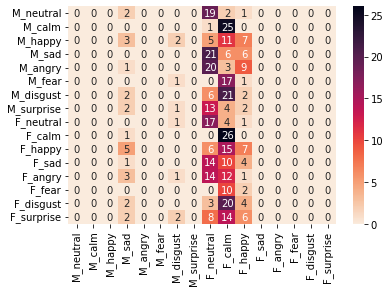

In [34]:
y_pred_time = model.predict(x_test_time)
matrix_time = confusion_matrix(y_test_time.argmax(axis=1), y_pred_time.argmax(axis=1))
ax = sns.heatmap(matrix_time, annot=True, fmt="d", cmap = 'rocket_r',
                 xticklabels = ['M_neutral', 'M_calm', 'M_happy', 'M_sad', 'M_angry', 'M_fear',
       'M_disgust', 'M_surprise', 'F_neutral', 'F_calm', 'F_happy',
       'F_sad', 'F_angry', 'F_fear', 'F_disgust', 'F_surprise'],
                 yticklabels = ['M_neutral', 'M_calm', 'M_happy', 'M_sad', 'M_angry', 'M_fear',
       'M_disgust', 'M_surprise', 'F_neutral', 'F_calm', 'F_happy',
       'F_sad', 'F_angry', 'F_fear', 'F_disgust', 'F_surprise'])

In [36]:
from sklearn.metrics import confusion_matrix, classification_report
print(classification_report(y_test_time.argmax(axis=1), y_pred_time.argmax(axis=1)))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        24
           1       0.00      0.00      0.00        26
           2       0.00      0.00      0.00        28
           3       0.00      0.00      0.00        33
           4       0.00      0.00      0.00        33
           5       0.00      0.00      0.00        19
           6       0.00      0.00      0.00        31
           7       0.00      0.00      0.00        22
           8       0.12      0.74      0.20        23
           9       0.13      0.96      0.23        27
          10       0.13      0.21      0.16        33
          11       0.00      0.00      0.00        29
          12       0.00      0.00      0.00        31
          13       0.00      0.00      0.00        12
          14       0.00      0.00      0.00        29
          15       0.00      0.00      0.00        32

    accuracy                           0.12       432
   macro avg       0.02   

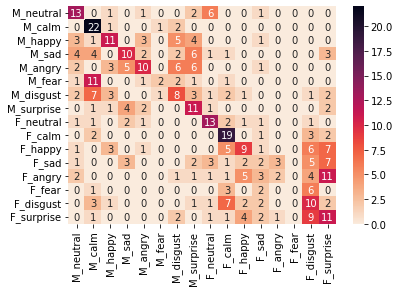

In [37]:
y_pred_spect = model_spect.predict(x_test_spect)
matrix_spect = confusion_matrix(y_test_spect.argmax(axis=1), y_pred_spect.argmax(axis=1))
ax = sns.heatmap(matrix_spect, annot=True, fmt="d", cmap = 'rocket_r',
                 xticklabels = ['M_neutral', 'M_calm', 'M_happy', 'M_sad', 'M_angry', 'M_fear',
       'M_disgust', 'M_surprise', 'F_neutral', 'F_calm', 'F_happy',
       'F_sad', 'F_angry', 'F_fear', 'F_disgust', 'F_surprise'],
                 yticklabels = ['M_neutral', 'M_calm', 'M_happy', 'M_sad', 'M_angry', 'M_fear',
       'M_disgust', 'M_surprise', 'F_neutral', 'F_calm', 'F_happy',
       'F_sad', 'F_angry', 'F_fear', 'F_disgust', 'F_surprise'])

In [38]:
print(classification_report(y_test_spect.argmax(axis=1), y_pred_spect.argmax(axis=1)))

              precision    recall  f1-score   support

           0       0.43      0.54      0.48        24
           1       0.41      0.85      0.55        26
           2       0.46      0.39      0.42        28
           3       0.42      0.30      0.35        33
           4       0.48      0.30      0.37        33
           5       0.50      0.11      0.17        19
           6       0.29      0.26      0.27        31
           7       0.30      0.50      0.37        22
           8       0.46      0.57      0.51        23
           9       0.44      0.70      0.54        27
          10       0.38      0.27      0.32        33
          11       0.12      0.07      0.09        29
          12       0.33      0.06      0.11        31
          13       0.00      0.00      0.00        12
          14       0.22      0.34      0.27        29
          15       0.23      0.34      0.28        32

    accuracy                           0.35       432
   macro avg       0.34   